In [1]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

## Constructing feature dataframes

In [163]:
metadata = 'E:/User/bruna.fistarol/HMM/Salmonella/metadata.tab'

In [164]:
df = pd.read_csv(metadata, sep='\t', header=None, names=['Strain', 'Antibiotic', 'MIC'])

In [165]:
df

,Strain,Antibiotic,MIC
0,SRR1177335,AMP:MIC,1
1,SRR1177335,AUG:MIC,1
2,SRR1177335,AXO:MIC,1
3,SRR1177335,CHL:MIC,1
4,SRR1177335,FOX:MIC,1
...,...,...,...
19340,SRR4280647,FOX:MIC,1
19341,SRR4280647,GEN:MIC,1
19342,SRR4280647,STR:MIC,4
19343,SRR4280647,TET:MIC,4


In [166]:
pivot_df = df.pivot_table(index='Strain', columns='Antibiotic', values='MIC', aggfunc='first')

In [167]:
pivot_df.columns = pivot_df.columns.str.rstrip(':MIC')

In [168]:
pivot_df

Antibiotic,AMP,AUG,AXO,CHL,FIS,FOX,GEN,KAN,STR,TET,TIO
Strain,,,,,,,,,,,
SRR1177335,1.0,1.0,1.0,1.0,NaN,1.0,4.0,NaN,4.0,4.0,1.0
SRR1177356,1.0,1.0,1.0,1.0,NaN,1.0,1.0,NaN,NaN,4.0,1.0
SRR1177360,1.0,1.0,1.0,1.0,NaN,1.0,1.0,NaN,NaN,1.0,1.0
SRR1177369,1.0,1.0,1.0,1.0,NaN,1.0,1.0,NaN,4.0,4.0,1.0
SRR1181521,1.0,1.0,1.0,1.0,NaN,1.0,1.0,NaN,4.0,4.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
SRR4280629,1.0,1.0,1.0,1.0,1.0,1.0,4.0,NaN,4.0,1.0,1.0
SRR4280640,1.0,1.0,1.0,1.0,1.0,1.0,1.0,NaN,4.0,4.0,1.0
SRR4280641,1.0,1.0,1.0,1.0,4.0,1.0,1.0,NaN,1.0,4.0,1.0


### Creating a table for each antibiotic

In [169]:
# A dictionary to store individual dataframes
dfs = {}

# Split each column into a new dataframe
for col in pivot_df.columns:
    dfs[col] = pivot_df[[col]].dropna()

### Add e-values for each susceptibility profile

In [170]:
hmm_search_path = 'E:/User/bruna.fistarol/HMM/Salmonella/Pfam_hmm_search'

In [182]:
for pfam in os.listdir(hmm_search_path):
    
    search_file = pd.read_csv(hmm_search_path + '/' + pfam, sep = '\t', comment = '#', header=None)
    s = search_file[0].str.split()
    evalues = pd.DataFrame(s.tolist())
    evalues.columns = ['target_name', 'accession', 'query_name', 'accession', 'E-value_fullseq', 'score_fullseq', 'bias_fullseq', 'E-value_bestdomain', 'score_bestdomain', 'bias_bestdomain', 'exp', 'reg', 'clu', 'ov', 'env', 'dom', 'rep', 'inc', 'description_of_target']
    evalues['target_name'] = evalues['target_name'].str.rstrip('.fasta')
    #evalues = evalues[['target_name', 'E-value_fullseq']].set_index('target_name', drop = True)
    evalues = evalues[['target_name', 'E-value_fullseq']].set_index('target_name', drop = True)
    #evalues.rename(columns={'E-value_fullseq': f'{pfam}'.split('.')[0]}, inplace = True)
    evalues.rename(columns={'E-value_fullseq': f'{pfam}'.split('.')[0]}, inplace = True)
    
    for antibiotic, table in dfs.items():
        dfs[antibiotic] = pd.concat([table, evalues], axis=1)


We need to drop rows with NaN:

In [183]:
for antibiotic in dfs.keys():
    dfs[antibiotic].dropna(inplace = True)

In [12]:
dfs['AMP']

,AMP,PLF_590_00000030,PLF_590_00000052,PLF_590_00000054,PLF_590_00000074,PLF_590_00000084,PLF_590_00000090,PLF_590_00000091,PLF_590_00000093,PLF_590_00000103,...,PLF_590_00003850,PLF_590_00003867,PLF_590_00004055,PLF_590_00004695,PLF_590_00004860,PLF_590_00006292,PLF_590_00006719,PLF_590_00008356,PLF_590_00009548,PLF_590_00024086
SRR1177335,1.0,2224.2,535.5,1103.1,3071.9,6620.8,1410.8,1884.5,5326.0,4750.8,...,431.1,923.6,797.8,416.5,329.2,15349.8,126.8,108.6,395.1,2230.6
SRR1177356,1.0,2239.5,534.2,1109.1,3095.7,6661.0,1427.5,1902.5,5328.4,4810.2,...,431.1,928.0,801.7,417.0,343.4,15473.2,126.8,111.4,395.6,2237.9
SRR1181521,1.0,2241.7,534.2,1109.1,3095.3,6662.2,1437.3,147.1,5349.6,4806.0,...,431.1,928.0,801.7,417.5,340.7,15459.2,125.1,111.4,393.9,2241.5
SRR1181532,1.0,2241.7,535.5,1109.1,3093.9,6663.0,1434.1,1898.0,5329.9,4810.2,...,429.9,920.8,801.7,417.5,343.4,15448.3,126.8,111.4,395.6,2237.5
SRR1181559,1.0,2239.9,534.2,1109.1,1314.0,6665.3,1437.3,147.1,5349.6,4806.0,...,431.1,928.0,801.7,417.5,340.7,15459.2,125.1,111.4,393.9,2241.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SRR4280624,1.0,2238.4,535.5,1105.7,3090.8,6649.1,1442.0,1889.5,5330.4,4783.7,...,429.9,918.3,801.2,417.5,341.4,15399.3,126.8,111.4,394.7,2225.9
SRR4280640,1.0,2232.6,533.7,1097.9,3072.5,6622.0,1422.1,1885.1,5322.5,4752.4,...,431.1,915.8,796.2,416.5,329.2,15358.6,126.8,108.6,394.3,2222.0
SRR4280641,1.0,2242.3,534.2,1109.1,3095.7,6663.1,1431.9,1902.5,5328.4,4810.2,...,431.1,928.0,800.5,417.0,343.4,15480.5,126.8,111.4,393.2,2240.7
SRR4280642,4.0,2242.3,534.2,1109.1,3095.7,6665.8,1431.9,1902.5,5328.4,4807.8,...,431.1,928.0,800.5,417.0,343.4,15480.5,126.8,111.4,393.2,2240.7


### Treating the e-values and replacing MIC for a binary classification

In [184]:
def sigmoid(x):
    return(1/ (1 + np.exp(-x)))

def minuslog(x):
    return(-np.log(x))

def profile(x):
    if x <= 2:
        return(0)
    else:
        return(1)

In [185]:
for antibiotic in dfs_2.keys():
    dfs_2[antibiotic] = dfs_2[antibiotic].astype('float')
    dfs[antibiotic].iloc[:, 1:] = dfs[antibiotic].iloc[:, 1:].apply(minuslog)
    dfs[antibiotic].iloc[:, 0] = dfs[antibiotic].iloc[:, 0].apply(profile)

TypeError: loop of ufunc does not support argument 0 of type str which has no callable log method

# Constructing DFs for scores from HMM per profile

In [ ]:
# A dictionary to store individual dataframes
dfs_s = {}
dfs_r = {}

In [ ]:
antibiotics_path = 'E:/User/bruna.fistarol/HMM/Salmonella/Antibiotics'

In [ ]:
for col in pivot_df.columns:
    dfs_s[col] = pd.DataFrame()
    dfs_r[col] = pd.DataFrame()

In [ ]:
for a in os.listdir(antibiotics_path):

    hmm_search_path = os.path.join(antibiotics_path, a, 'Susceptible', 'Pfam_hmm_search')

    for pfam in os.listdir(hmm_search_path):

        search_file = pd.read_csv(hmm_search_path + '/' + pfam, sep = '\t', comment = '#', header=None)
        s = search_file[0].str.split()
        evalues = pd.DataFrame(s.tolist())
        evalues.columns = ['target_name', 'accession', 'query_name', 'accession', 'E-value_fullseq', 'score_fullseq', 'bias_fullseq', 'E-value_bestdomain', 'score_bestdomain', 'bias_bestdomain', 'exp', 'reg', 'clu', 'ov', 'env', 'dom', 'rep', 'inc', 'description_of_target']
        evalues['target_name'] = evalues['target_name'].str.rstrip('.fasta')
        #evalues = evalues[['target_name', 'E-value_fullseq']].set_index('target_name', drop = True)
        evalues = evalues[['target_name', 'score_fullseq']].set_index('target_name', drop = True)
        #evalues.rename(columns={'E-value_fullseq': f'{pfam}'.split('.')[0]}, inplace = True)
        evalues.rename(columns={'score_fullseq': f'{pfam}'.split('.')[0]}, inplace = True)

        dfs_s[a] = pd.concat([dfs_s[a], evalues], axis=1)
    
    dfs_s[a].insert(loc = 0, column = a, value = 0)
        
        
    hmm_search_path = os.path.join(antibiotics_path, a, 'Resistant', 'Pfam_hmm_search')

    for pfam in os.listdir(hmm_search_path):

        search_file = pd.read_csv(hmm_search_path + '/' + pfam, sep = '\t', comment = '#', header=None)
        s = search_file[0].str.split()
        evalues = pd.DataFrame(s.tolist())
        evalues.columns = ['target_name', 'accession', 'query_name', 'accession', 'E-value_fullseq', 'score_fullseq', 'bias_fullseq', 'E-value_bestdomain', 'score_bestdomain', 'bias_bestdomain', 'exp', 'reg', 'clu', 'ov', 'env', 'dom', 'rep', 'inc', 'description_of_target']
        evalues['target_name'] = evalues['target_name'].str.rstrip('.fasta')
        #evalues = evalues[['target_name', 'E-value_fullseq']].set_index('target_name', drop = True)
        evalues = evalues[['target_name', 'score_fullseq']].set_index('target_name', drop = True)
        #evalues.rename(columns={'E-value_fullseq': f'{pfam}'.split('.')[0]}, inplace = True)
        evalues.rename(columns={'score_fullseq': f'{pfam}'.split('.')[0]}, inplace = True)

        dfs_r[a] = pd.concat([dfs_r[a], evalues], axis=1)
        
    dfs_r[a].insert(loc = 0, column = a, value = 1)


In [74]:
dfs_2 = {}
for a in os.listdir(antibiotics_path):
    dfs_2[a] = pd.concat([dfs_s[a].sort_index(), dfs_r[a].sort_index()], axis=0)


In [81]:
for a in os.listdir(antibiotics_path):
    dfs[a] = pd.concat([dfs[a][dfs[a][a] == 0].sort_index(), dfs[a][dfs[a][a] == 1].sort_index()], axis=0)

In [93]:
difference = dfs_2['AMP'] - dfs['AMP']

In [100]:
difference

,AMP,PLF_590_00000030,PLF_590_00000052,PLF_590_00000054,PLF_590_00000074,PLF_590_00000084,PLF_590_00000090,PLF_590_00000091,PLF_590_00000093,PLF_590_00000103,...,PLF_590_00003850,PLF_590_00003867,PLF_590_00004055,PLF_590_00004695,PLF_590_00004860,PLF_590_00006292,PLF_590_00006719,PLF_590_00008356,PLF_590_00009548,PLF_590_00024086
SRR1177335,0.0,5.6,-0.1,0.7,3.2,10.6,15.8,5.0,0.1,11.7,...,0.9,1.5,0.7,0.4,3.2,39.1,0.2,0.7,0.2,0.8
SRR1177356,0.0,-0.6,-0.6,-1.7,-3.5,-5.0,-12.6,-0.1,-11.5,-7.6,...,0.9,-0.3,-0.3,0.3,-1.3,-15.9,0.2,-0.4,-0.3,-4.1
SRR1181521,0.0,-2.2,-0.6,-1.7,-5.2,-0.9,-13.0,-2.1,-9.9,-0.8,...,0.9,-0.3,-0.3,0.4,-1.0,-4.5,-0.1,-0.4,-0.1,-3.8
SRR1181532,0.0,-2.2,-0.1,-1.7,-5.6,-6.2,-13.2,0.3,-12.2,-7.6,...,0.5,-1.5,-0.3,0.4,-1.3,-8.0,0.2,-0.4,-0.3,-5.4
SRR1181559,0.0,-2.2,-0.6,-1.7,-1.1,-0.9,-13.0,-2.1,-9.9,-0.8,...,0.9,-0.3,-0.3,0.4,-1.0,-4.5,-0.1,-0.4,-0.1,-3.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SRR4280624,0.0,2.2,-0.1,-1.1,-2.2,4.7,10.1,2.4,-4.3,2.0,...,0.5,1.1,0.6,0.4,-1.4,10.2,0.2,-0.4,0.0,-1.0
SRR4280640,0.0,5.0,0.3,1.4,4.3,12.0,14.7,5.5,0.7,12.3,...,0.9,2.4,0.6,0.4,3.2,40.9,0.2,0.7,0.3,1.7
SRR4280641,0.0,-0.6,-0.6,-1.7,-3.5,-5.3,-12.7,-0.1,-11.5,-7.6,...,0.9,-0.3,-0.6,0.3,-1.3,-15.6,0.2,-0.4,-0.6,-4.2
SRR4280642,0.0,5.2,0.2,1.5,5.6,15.8,32.2,5.2,7.5,4.0,...,0.6,2.7,1.3,2.3,2.2,44.0,0.1,0.1,1.2,2.7


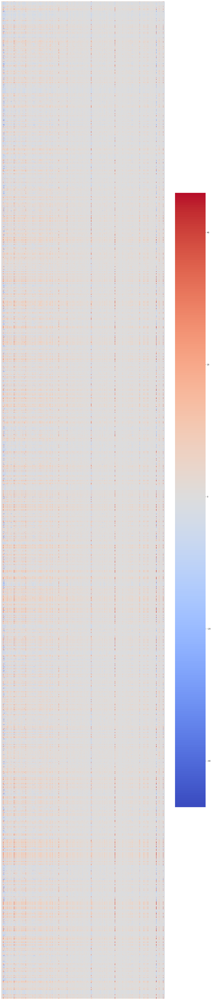

In [101]:
fig, ax = plt.subplots(figsize=(20, 100))  # Adjust as needed

# Create the heatmap
sns.heatmap(difference, cmap='coolwarm', center=0, cbar=True, ax=ax,
            xticklabels=False, yticklabels=False, annot=False, linewidths=0, linecolor='white')

# Remove the grid lines to make it easier to read
ax.grid(False)

plt.show()

In [127]:
# A dictionary to store individual dataframes
dfs_s_all = {}
dfs_r_all = {}

In [128]:
for col in pivot_df.columns:
    dfs_s_all[col] = pd.DataFrame()
    dfs_r_all[col] = pd.DataFrame()

In [129]:
for a in os.listdir(antibiotics_path):

    hmm_search_path = os.path.join(antibiotics_path, a, 'Susceptible', 'Pfam_hmm_search_all')

    for pfam in os.listdir(hmm_search_path):

        search_file = pd.read_csv(hmm_search_path + '/' + pfam, sep = '\t', comment = '#', header=None)
        s = search_file[0].str.split()
        evalues = pd.DataFrame(s.tolist())
        evalues.columns = ['target_name', 'accession', 'query_name', 'accession', 'E-value_fullseq', 'score_fullseq', 'bias_fullseq', 'E-value_bestdomain', 'score_bestdomain', 'bias_bestdomain', 'exp', 'reg', 'clu', 'ov', 'env', 'dom', 'rep', 'inc', 'description_of_target']
        evalues['target_name'] = evalues['target_name'].str.rstrip('.fasta')
        #evalues = evalues[['target_name', 'E-value_fullseq']].set_index('target_name', drop = True)
        evalues = evalues[['target_name', 'score_fullseq']].set_index('target_name', drop = True)
        #evalues.rename(columns={'E-value_fullseq': f'{pfam}'.split('.')[0]}, inplace = True)
        evalues.rename(columns={'score_fullseq': f'{pfam}'.split('.')[0]}, inplace = True)

        dfs_s_all[a] = pd.concat([dfs_s_all[a], evalues], axis=1)
    
    dfs_s_all[a].insert(loc = 0, column = a, value = 1)
        
        
    hmm_search_path = os.path.join(antibiotics_path, a, 'Resistant', 'Pfam_hmm_search_all')

    for pfam in os.listdir(hmm_search_path):

        search_file = pd.read_csv(hmm_search_path + '/' + pfam, sep = '\t', comment = '#', header=None)
        s = search_file[0].str.split()
        evalues = pd.DataFrame(s.tolist())
        evalues.columns = ['target_name', 'accession', 'query_name', 'accession', 'E-value_fullseq', 'score_fullseq', 'bias_fullseq', 'E-value_bestdomain', 'score_bestdomain', 'bias_bestdomain', 'exp', 'reg', 'clu', 'ov', 'env', 'dom', 'rep', 'inc', 'description_of_target']
        evalues['target_name'] = evalues['target_name'].str.rstrip('.fasta')
        #evalues = evalues[['target_name', 'E-value_fullseq']].set_index('target_name', drop = True)
        evalues = evalues[['target_name', 'score_fullseq']].set_index('target_name', drop = True)
        #evalues.rename(columns={'E-value_fullseq': f'{pfam}'.split('.')[0]}, inplace = True)
        evalues.rename(columns={'score_fullseq': f'{pfam}'.split('.')[0]}, inplace = True)

        dfs_r_all[a] = pd.concat([dfs_r_all[a], evalues], axis=1)
        
    dfs_r_all[a].insert(loc = 0, column = a, value = 0)


In [130]:
dfs_hmm_0 = {}
for a in os.listdir(antibiotics_path):
    dfs_hmm_0[a] = pd.concat([dfs_s[a].sort_index(), dfs_s_all[a].sort_index()], axis=0)

dfs_hmm_1 = {}
for a in os.listdir(antibiotics_path):
    dfs_hmm_1[a] = pd.concat([dfs_r_all[a].sort_index(), dfs_r[a].sort_index()], axis=0)


In [131]:
for antibiotic in dfs_2.keys():
    dfs_hmm_0[antibiotic] = dfs_hmm_0[antibiotic].astype('float')
    dfs_hmm_1[antibiotic] = dfs_hmm_1[antibiotic].astype('float')

In [132]:
dfs_ratio = {}
for a in os.listdir(antibiotics_path):
    dfs_ratio[a] = pd.concat([dfs_hmm_0[a][a], dfs_hmm_0[a].loc[:, dfs_hmm_0[a].columns != a]/dfs_hmm_1[a].loc[:, dfs_hmm_1[a].columns != a]], axis=1)

# Visualizing 

In [175]:
antibiotics = list(dfs.keys())

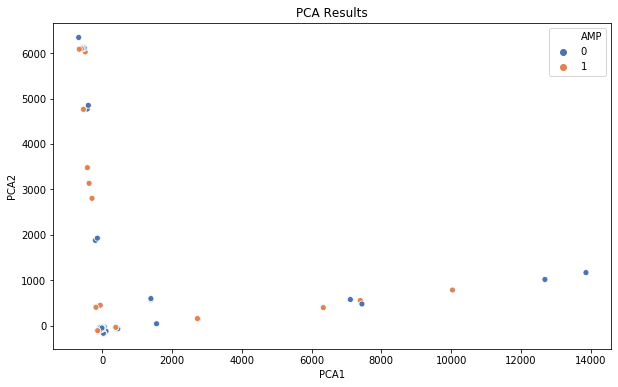

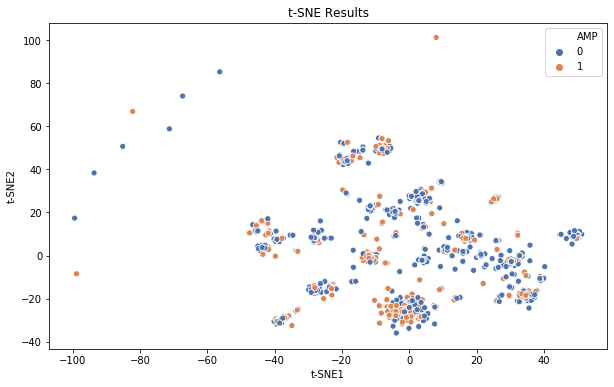

In [176]:
# For the PCA plot
df = dfs['AMP']

# Separate out the features and labels
features = df.drop(columns=['AMP'])
labels = df['AMP']

# Apply PCA and reduce to two dimensions
pca = PCA(n_components=2)
pca_result = pca.fit_transform(features)
df['PCA1'] = pca_result[:,0]
df['PCA2'] = pca_result[:,1]

# Plot PCA results
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PCA1', y='PCA2', hue=labels, data=df, palette='deep')
plt.title('PCA Results')
plt.savefig("PCA_hmmsearch_scores_AMP_hmmall.png", dpi=300, facecolor='white')  # Save the figure before showing it
plt.show()

# For the t-SNE plot
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(features)
df['t-SNE1'] = tsne_results[:,0]
df['t-SNE2'] = tsne_results[:,1]

# Plot t-SNE results
plt.figure(figsize=(10, 6))
sns.scatterplot(x='t-SNE1', y='t-SNE2', hue=labels, data=df, palette='deep')
plt.title('t-SNE Results')
plt.savefig("tsne_hmmsearch_scores_AMP_hmmall.png", dpi=300, facecolor='white')  # Save the figure before showing it
plt.show()

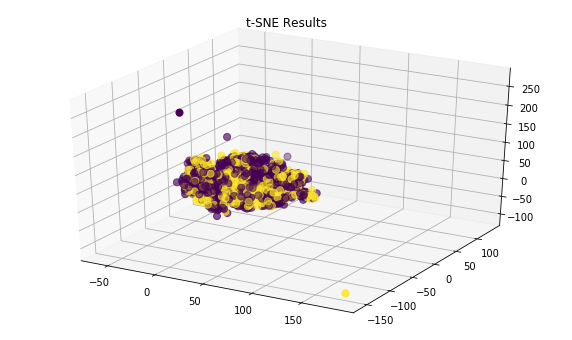

In [127]:
# Apply PCA and reduce to three dimensions
pca = PCA(n_components=3)
pca_result = pca.fit_transform(features)
df['PCA1'] = pca_result[:,0]
df['PCA2'] = pca_result[:,1]
df['PCA3'] = pca_result[:,2]

# Apply t-SNE with three dimensions
tsne = TSNE(n_components=3, random_state=10)
tsne_results = tsne.fit_transform(features)
df['t-SNE1'] = tsne_results[:,0]
df['t-SNE2'] = tsne_results[:,1]
df['t-SNE3'] = tsne_results[:,2]

# 3D Plot for t-SNE results
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df['t-SNE1'], df['t-SNE2'], df['t-SNE3'], c=labels, cmap='viridis', s=50)
ax.set_title('t-SNE Results')
plt.show()

In [177]:
def read_fasta_file(file_path):
    sequences = {}
    with open(file_path, 'r') as file:
        sequence = ''
        header = ''
        for line in file:
            if line.startswith('>'):
                if sequence and header:
                    sequences[header] = sequence
                    sequence = ''
                header = line.strip()[1:]
            else:
                sequence += line.strip()
        if sequence and header:
            sequences[header] = sequence
    return sequences

In [178]:
length_0 = ['PLF_590_00003204', 'PLF_590_00000441', 'PLF_590_00002421', 'PLF_590_00002841', 'PLF_590_00000215', 'PLF_590_00002480', 'PLF_590_00000236', 'PLF_590_00000543', 'PLF_590_00024086']

In [179]:
length_1 = list(read_fasta_file('E:/User/bruna.fistarol/HMM/Salmonella/length_1_mateosppi.fasta').keys())
length_2 = list(read_fasta_file('E:/User/bruna.fistarol/HMM/Salmonella/length_2_mateosppi.fasta').keys())
length_3 = list(read_fasta_file('E:/User/bruna.fistarol/HMM/Salmonella/length_3_mateosppi.fasta').keys())
length_4 = list(read_fasta_file('E:/User/bruna.fistarol/HMM/Salmonella/length_4_mateosppi.fasta').keys())

In [180]:
for a in antibiotics:
    print(len(dfs[a].index))

1396
1396
1396
1396
1306
1396
1396
235
799
1396
1396


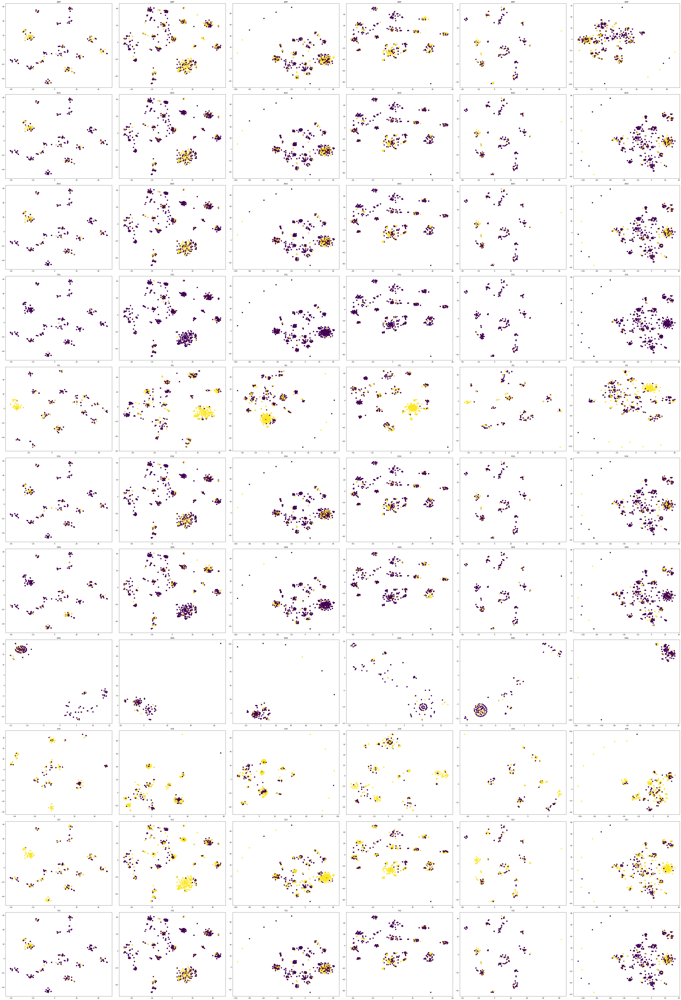

In [181]:
figure, axis = plt.subplots(nrows=len(antibiotics), ncols=6, figsize=(10*6, 8*len(antibiotics)))  # Adjusting the size to fit all plots

for row in range(len(antibiotics)):
    for col in range(5):
        data = dfs[antibiotics[row]][[antibiotics[row]] + globals()[f'length_{col}']]
        features = data.drop(columns=[antibiotics[row]])
        labels = data[antibiotics[row]]
        
        # Apply t-SNE with two dimensions
        tsne = TSNE(n_components=2, random_state=10)
        tsne_results = tsne.fit_transform(features)
        
        df_tsne = pd.DataFrame()  
        df_tsne['t-SNE1'] = tsne_results[:,0]
        df_tsne['t-SNE2'] = tsne_results[:,1]

        # 2D Plot for t-SNE results
        ax = axis[row, col]  # Use the current axis
        scatter = ax.scatter(df_tsne['t-SNE1'], df_tsne['t-SNE2'], c=labels, cmap='viridis', s=50)
        ax.set_title(antibiotics[row])
        
    data = dfs[antibiotics[row]]
    features = data.drop(columns=[antibiotics[row]])
    labels = data[antibiotics[row]]

    # Apply t-SNE with two dimensions
    tsne = TSNE(n_components=2, random_state=10)
    tsne_results = tsne.fit_transform(features)

    df_tsne = pd.DataFrame()  
    df_tsne['t-SNE1'] = tsne_results[:,0]
    df_tsne['t-SNE2'] = tsne_results[:,1]

    # 2D Plot for t-SNE results
    ax = axis[row, 5]  # Use the current axis
    scatter = ax.scatter(df_tsne['t-SNE1'], df_tsne['t-SNE2'], c=labels, cmap='viridis', s=50)
    ax.set_title(antibiotics[row])


plt.tight_layout() 
figure.savefig("tsne_hmmsearch_scores_ratio_hmmall.png", dpi=300, facecolor='white')
plt.show()

In [128]:
col=0

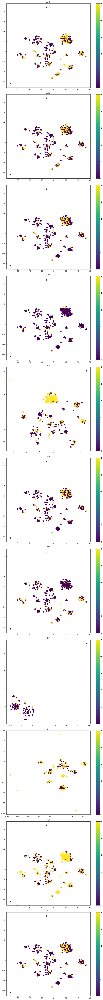

In [129]:
figure, axis = plt.subplots(nrows=len(antibiotics), ncols=1, figsize=(10, 8*len(antibiotics)))  # Adjusting the size to fit all plots

for row in range(len(antibiotics)):
    data = dfs[antibiotics[row]][[antibiotics[row]] + globals()[f'length_{col + 1}']]
    features = data.drop(columns=[antibiotics[row]])
    labels = data[antibiotics[row]]

    # Apply t-SNE with two dimensions
    tsne = TSNE(n_components=2, random_state=10)
    tsne_results = tsne.fit_transform(features)

    df_tsne = pd.DataFrame()  
    df_tsne['t-SNE1'] = tsne_results[:,0]
    df_tsne['t-SNE2'] = tsne_results[:,1]

    # 2D Plot for t-SNE results
    ax = axis[row]  # Use the current axis
    scatter = ax.scatter(df_tsne['t-SNE1'], df_tsne['t-SNE2'], c=labels, cmap='viridis', s=50)
    ax.set_title(antibiotics[row])

    # Optionally, you can add a colorbar for clarity
    cbar = figure.colorbar(scatter, ax=ax, format='%1.0f')

plt.tight_layout()
plt.show()

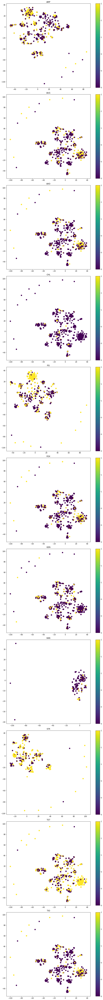

In [130]:
figure, axis = plt.subplots(nrows=len(antibiotics), ncols=1, figsize=(10, 8*len(antibiotics)))  # Adjusting the size to fit all plots

for row in range(len(antibiotics)):
    data = dfs[antibiotics[row]] # hmm all
    features = data.drop(columns=[antibiotics[row]])
    labels = data[antibiotics[row]]

    # Apply t-SNE with two dimensions
    tsne = TSNE(n_components=2, random_state=10)
    tsne_results = tsne.fit_transform(features)

    df_tsne = pd.DataFrame()  
    df_tsne['t-SNE1'] = tsne_results[:,0]
    df_tsne['t-SNE2'] = tsne_results[:,1]

    # 2D Plot for t-SNE results
    ax = axis[row]  # Use the current axis
    scatter = ax.scatter(df_tsne['t-SNE1'], df_tsne['t-SNE2'], c=labels, cmap='viridis', s=50)
    ax.set_title(antibiotics[row])

    # Optionally, you can add a colorbar for clarity
    cbar = figure.colorbar(scatter, ax=ax, format='%1.0f')

plt.tight_layout()
plt.show()

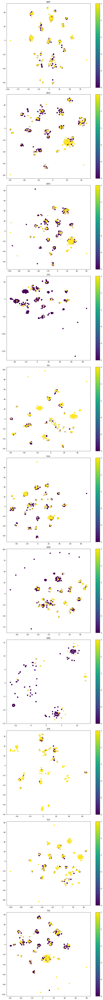

In [133]:
figure, axis = plt.subplots(nrows=len(antibiotics), ncols=1, figsize=(10, 8*len(antibiotics)))  # Adjusting the size to fit all plots

for row in range(len(antibiotics)):
    data = dfs_ratio[antibiotics[row]] # ratio
    features = data.drop(columns=[antibiotics[row]])
    labels = data[antibiotics[row]]

    # Apply t-SNE with two dimensions
    tsne = TSNE(n_components=2, random_state=10)
    tsne_results = tsne.fit_transform(features)

    df_tsne = pd.DataFrame()  
    df_tsne['t-SNE1'] = tsne_results[:,0]
    df_tsne['t-SNE2'] = tsne_results[:,1]

    # 2D Plot for t-SNE results
    ax = axis[row]  # Use the current axis
    scatter = ax.scatter(df_tsne['t-SNE1'], df_tsne['t-SNE2'], c=labels, cmap='viridis', s=50)
    ax.set_title(antibiotics[row])

    # Optionally, you can add a colorbar for clarity
    cbar = figure.colorbar(scatter, ax=ax, format='%1.0f')

plt.tight_layout()
plt.show()

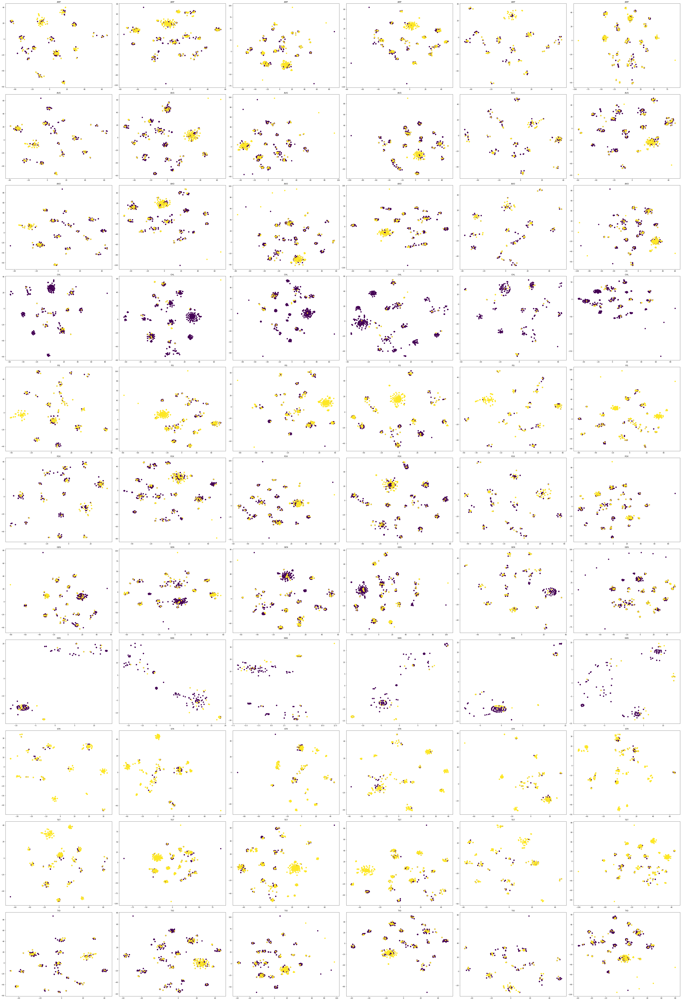

<Figure size 432x288 with 0 Axes>

In [161]:
figure, axis = plt.subplots(nrows=len(antibiotics), ncols=6, figsize=(10*6, 8*len(antibiotics)))  # Adjusting the size to fit all plots

for row in range(len(antibiotics)):
    for col in range(5):
        data = dfs_ratio[antibiotics[row]][[antibiotics[row]] + globals()[f'length_{col}']]
        features = data.drop(columns=[antibiotics[row]])
        labels = data[antibiotics[row]]
        
        # Apply t-SNE with two dimensions
        tsne = TSNE(n_components=2, random_state=10)
        tsne_results = tsne.fit_transform(features)
        
        df_tsne = pd.DataFrame()  
        df_tsne['t-SNE1'] = tsne_results[:,0]
        df_tsne['t-SNE2'] = tsne_results[:,1]

        # 2D Plot for t-SNE results
        ax = axis[row, col]  # Use the current axis
        scatter = ax.scatter(df_tsne['t-SNE1'], df_tsne['t-SNE2'], c=labels, cmap='viridis', s=50)
        ax.set_title(antibiotics[row])
        
    data = dfs_ratio[antibiotics[row]]
    features = data.drop(columns=[antibiotics[row]])
    labels = data[antibiotics[row]]

    # Apply t-SNE with two dimensions
    tsne = TSNE(n_components=2, random_state=10)
    tsne_results = tsne.fit_transform(features)

    df_tsne = pd.DataFrame()  
    df_tsne['t-SNE1'] = tsne_results[:,0]
    df_tsne['t-SNE2'] = tsne_results[:,1]

    # 2D Plot for t-SNE results
    ax = axis[row, 5]  # Use the current axis
    scatter = ax.scatter(df_tsne['t-SNE1'], df_tsne['t-SNE2'], c=labels, cmap='viridis', s=50)
    ax.set_title(antibiotics[row])


plt.tight_layout() 
plt.show()
plt.savefig('tsne_hmmsearch_scores.png', dpi=1200)

In [159]:
column_titles = ['AMR', 'Length 1', 'Length 2', 'Length 3', 'Length 4', 'All 500 genesl'] 
for col, title in enumerate(column_titles):
    x = (1 / 6) * (col + 0.45)  # center the title above each column
    y = 0.2  # place the title at the top of the figure
    figure.text(x=x, y=y, s=title, ha='center', va='bottom', fontsize=12, fontweight='bold')

plt.tight_layout(rect=[0, 0, 1, 0.95])  # The last value less than 1 adds padding at the top

<Figure size 432x288 with 0 Axes>

In [162]:
figure.savefig("tsne_hmmsearch_scores_ratio_hmm0byhmm1.png", dpi=300, facecolor='white')